In [40]:
# install.packages("gmm", repos="http://cran.rstudio.com/") 
# install.packages("dyn", repos="http://cran.rstudio.com/") 
# install.packages("data.table", repos="http://cran.rstudio.com/")
# install.packages("dyn", repos="http://cran.rstudio.com/") 
# install.packages("xtable", repos="http://cran.rstudio.com/") 
# install.packages("ggplot2", repos="http://cran.rstudio.com/") 
# install.packages("urca", repos="http://cran.rstudio.com/") 


In [41]:
set.seed(12345678)


# upload library data

library(data.table)
library(dyn)
library(xtable)
library(gmm)
library(ggplot2)


       X           Year          DP            Dgrowth           Ret_SP      
 Min.   : 3   Min.   : 4   Min.   :0.0069   Min.   :0.3989   Min.   :0.6227  
 1st Qu.:26   1st Qu.:27   1st Qu.:0.0149   1st Qu.:0.9917   1st Qu.:0.9406  
 Median :49   Median :50   Median :0.0225   Median :1.0291   Median :1.0692  
 Mean   :49   Mean   :50   Mean   :0.0222   Mean   :1.0492   Mean   :1.0603  
 3rd Qu.:72   3rd Qu.:73   3rd Qu.:0.0263   3rd Qu.:1.1112   3rd Qu.:1.1500  
 Max.   :95   Max.   :96   Max.   :0.0606   Max.   :1.7273   Max.   :1.6420  
      DPP         
 Min.   :0.00950  
 1st Qu.:0.01500  
 Median :0.02250  
 Mean   :0.02237  
 3rd Qu.:0.02630  
 Max.   :0.06060  

                     b         t         prob         sd
reg_R_DP    6.86780119  4.000424 6.322921e-05  6.1406195
reg_DG_DP  -2.50354518 -1.422987 1.547398e-01  2.2384629
reg_DP_DP   0.82380590 14.036974 9.258184e-45  0.7365791
reg_r_dp    0.12923053  2.912340 3.587322e-03  5.1207946
reg_dg_dp  -0.04966619 -1.098856 2.718309e-01  1.9680362
reg_dpp_dp  0.83906478 16.549418 1.616578e-61 33.2481673


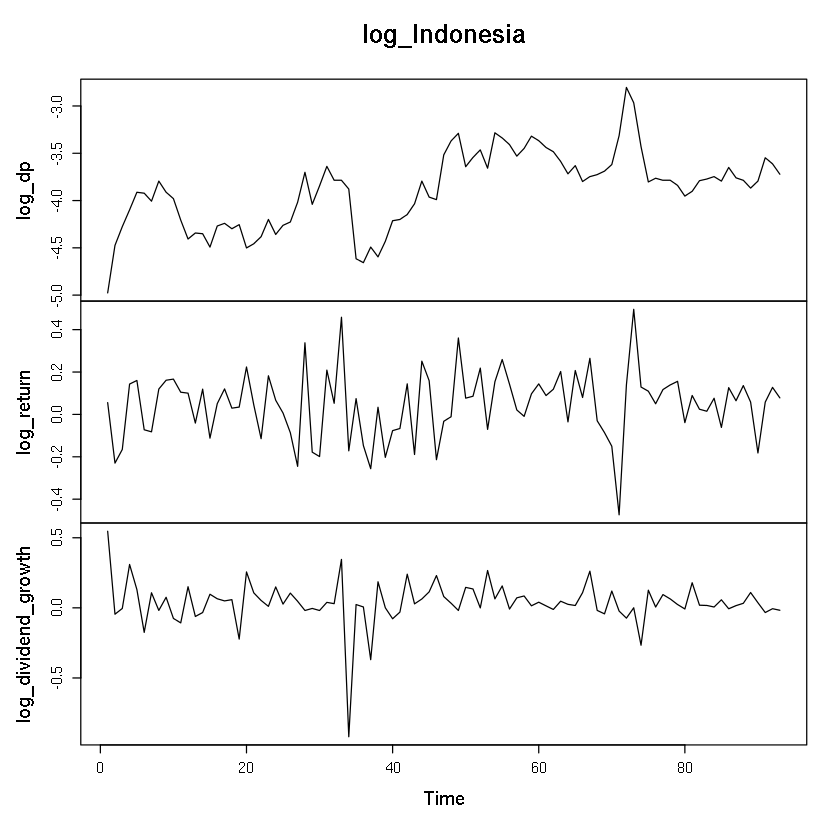

In [42]:

# Statistical Inference

library(gmm) 
library(dyn)
library(urca)

# Load Data

strPath       <- "Indoclean.csv"
data_skripsi  <- as.data.table(read.csv(strPath))
ts_data <- ts(data_skripsi)

summary(ts_data)


#### Plotting

# strPath_plot       <- "Indoplot.csv"
# data_plot  <- as.data.table(read.csv(strPath_plot))
# Data_Indonesia <- ts(data_plot)


# plot(Data_Indonesia)

# plot data log

log_dp <- ts(dp)
log_return <- ts(ri)
log_dividend_growth  <- ts(dg)

log_Indonesia <- cbind( log_dp, log_return, log_dividend_growth)
plot(log_Indonesia)



#####
DP <- as.matrix(ts_data[,"DP"], start = nrow(ts_data), 1)
RI <- as.matrix(ts_data[,"Ret_SP"], start = nrow(ts_data), 1)
DG <- as.matrix(ts_data[,"Dgrowth"], start = nrow(ts_data), 1)
DPP <- as.matrix(ts_data[,"DPP"], start = nrow(ts_data), 1)
ri <- as.matrix(log(ts_data[,"Ret_SP"]), start = nrow(ts_data), 1)
dg <- as.matrix(log(ts_data[,"Dgrowth"]), start = nrow(ts_data), 1)
dp <-  as.matrix(log(ts_data[,"DP"]), start = nrow(ts_data), 1)
dpp <- as.matrix(log(ts_data[,"DPP"]), start = nrow(ts_data), 1)

# Correlation 
data_deskriptif <- cbind(RI, DG, DP)
corr_data_deskriptif <- cor(data_deskriptif)

write.csv(corr_data_deskriptif, file = "Indonesia deskriptif corr.csv")
var_DP <- var(DP)
var_RI <- var(RI)
var_DG <- var(DG)

list_reg <- list(reg_R_DP = gmm(RI ~ DP, x = DP, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest, data=ts_data),
                 reg_DG_DP = gmm(DG ~ DP, x = DP, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest, data=ts_data),
                 reg_DP_DP = gmm(DPP ~ DP, x = DP, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest, data=ts_data),
                 reg_r_dp = gmm(ri ~ dp, x = dp, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest),
                 reg_dg_dp =  gmm(dg ~ dp, x = dp, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest),
                 reg_dpp_dp = gmm(dpp ~ dp, x = dp, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest)
                 )
tabel1 <- t(as.data.frame(lapply(list_reg[1:6], FUN = function(reg) {
  c(b = summary(reg)$coef[2,1],
    t = summary(reg)$coef[2,3],
    prob = summary(reg)$coef[2,4],
    sd = sd(reg$fitted) * 100 
    )
})))

print(tabel1)

write.csv(tabel1, file = "Indonesia tabel1.csv")


In [43]:



### Regression one by one by one
reg_R_DP <- gmm(RI ~ DP, x = DP, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest, data=ts_data)
reg_DG_DP <- gmm(DG ~ DP, x = DP, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest, data=ts_data)
reg_DP_DP <- gmm(DPP ~ DP, x = DP, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest, data=ts_data)
# summary(reg_R_DP)
# summary(reg_DG_DP)
# summary(reg_DP_DP)


### Resid gross
R_DP_resid <-  residuals(reg_R_DP)
DG_DP_resid <-  residuals(reg_DG_DP)
DPP_DP_resid <-  residuals(reg_DP_DP)
RESIDUALS_reg <- cbind(R_DP_resid, DG_DP_resid, DPP_DP_resid)
RESIDUALS_reg_cor <- cor(RESIDUALS_reg)

write.csv(RESIDUALS_reg_cor, file = "Indonesia Gross residuals.csv")

# R square Gross

R2R <- 1 - (var(R_DP_resid)/var(RI))
R2D <- 1 - (var(DG_DP_resid)/var(DG))
R2DP <- 1 - (var(DPP_DP_resid)/var(DPP))

R2REG <- t(as.data.frame( cbind(R2R, R2D, R2DP)))
R2REG

write.csv(R2REG, file = "R square gross.csv")

##### log Campbell Shiller present value identity

reg_r_dp <- gmm(ri ~ dp, x = dp, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest)
reg_dg_dp <- gmm(dg ~ dp, x = dp, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest)
reg_dpp_dp <- gmm(dpp ~ dp, x = dp, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest)
reg_ri_dg <- gmm(ri ~ dg, x = dg, type= c("twoStep"), vcov=c("HAC"), bw = bwNeweyWest)


# summary(reg_r_dp)
# summary(reg_dg_dp)
# summary(reg_dpp_dp)
# summary(reg_ri_dg) 

##### Residuals Campbell Shiller
r_dp_resid <-  residuals(reg_r_dp)
dg_dp_resid <-  residuals(reg_dg_dp)
dpp_dp_resid <-  residuals(reg_dpp_dp)
ri_dg_resid <-  residuals(reg_ri_dg)

residuals_reg <- cbind(r_dp_resid, dg_dp_resid, dpp_dp_resid)
cor_residuals <- cor(residuals_reg)
cor_residuals

cor(r_dp_resid, dpp_dp_resid)
cor(dg_dp_resid, dpp_dp_resid)


write.csv(cor_residuals, file = "Indonesia Korelasi residual.csv")

# Cov error analysis
cov(r_dp_resid, dpp_dp_resid)
cov(dg_dp_resid, dpp_dp_resid)
var(dpp_dp_resid)*rho
var(r_dp_resid)
var(dg_dp_resid)
sd(r_dp_resid)
sd(dpp_dp_resid)
sd(dg_dp_resid)

i_vd = ((var(dpp_dp_resid))* (rho**2) + (var(r_dp_resid)))^(0.5)


cor_i <- (rho *sd(dpp_dp_resid))/i_vd 

##########
dg_1 <- var( dg_dp_resid)
dg_2 <- rho*(cov(dg_dp_resid, dpp_dp_resid))

cov_di <- dg_1 - dg_2

corr_dgi <- (cov_di/(sd(r_dp_resid))*(sd(dg_dp_resid)))

## R square log

R2d <- 1 - (var(dg_dp_resid)/var(dg))
R2r <- 1 - (var(r_dp_resid)/var(ri))
R2dp <- 1 - (var(dpp_dp_resid)/var(dpp))
R2ri_dg <- 1 - (var(ri_dg_resid)/var(ri))
R2reg <- t(as.data.frame( cbind(R2r, R2d, R2dp)))
R2reg

write.table(R2reg, file = "R square log.csv")



V1,0.1340747
V2,0.02229086
V3,0.7012152


1.0000000,0.3166193,-0.5669850
0.3166193,1.0000000,0.6017528
-0.5669850,0.6017528,1.0000000


-0.566985


0.6017528


-0.01554518


0.01711502


0.03275605


0.02248614


0.02419831


[1] 0.1499538

[1] 0.1828381

[1] 0.1555581

V1,0.1044373
V2,0.01575378
V3,0.7678066


In [44]:

### Unit root test

root_DP <- ur.df(DP, selectlags = c("BIC"), type='trend')
root_RI <- ur.df(RI, selectlags = c("BIC"), type='trend')
root_DG <- ur.df(DG, selectlags = c("BIC"), type='trend')
root_dp <- ur.df(dp, selectlags = c("BIC"), type='trend')
root_ri <- ur.df(ri, selectlags = c("BIC"), type='trend')
root_dg <- ur.df(dg, selectlags = c("BIC"), type='trend')

# summary(root_DP)
# summary(root_RI)
# summary(root_DG)
# summary(root_dp)
# summary(root_ri)
# summary(root_dg)

# KPPS

kpps_DP <- ur.kpss(DP, type=c("mu","tau"), lags="short")
kpps_RI <- ur.kpss(RI, type=c("mu", "tau"), lags="long")
kpps_DG <- ur.kpss(DG, type=c("mu","tau"), lags="short")
kpps_dp <- ur.kpss(dp, type=c("mu","tau"), lags="short")
kpps_ri <- ur.kpss(ri, type=c("mu","tau"), lags="short")
kpps_dg <- ur.kpss(dg, type=c("mu", "tau"), lags="short")

# summary(kpps_DP)
# summary(kpps_RI)
# summary(kpps_DG)
# summary(kpps_dp)
# summary(kpps_ri)
# summary(kpps_dg)



In [50]:


# Calculating Rho and Phi, vec 0f standard deviation

dividendprice <- ts_data[,"DP"]

PD = exp(-mean(log(dividendprice)));
rho = exp(-mean(log(dividendprice)))/(1+exp(-mean(log(dividendprice))));
# PD ; rho

phi <-  summary(reg_dpp_dp)$coef[2,1]
br <-  summary(reg_r_dp)$coef[2,1]
bd <-  summary(reg_dg_dp)$coef[2,1]

# phi ; br ; bd

br_implied <- (1-phi*rho + bd)
bd_implied <- (br + phi*rho -1 )
phi_implied <- (bd-br+1)/rho

coef_implied <- cbind ( br_implied, bd_implied, phi_implied)
write.csv(coef_implied, file = "Indonesia coef impled.csv")

LR_br_Implied1 <- br / (1-rho*phi_implied)
LR_br_Implied2 <- br_implied / (1-rho*phi)
LR_br_Implied3 <- br_implied / (1-rho*phi_implied)


LR_br <- br / (1-rho*phi)
LR_bd <- bd / (1-rho*phi)
## Nilai Rho, Phi, Beta return, Beta Dividend Growth.
# rho ; phi; br; bd ;
# LR_br ; LR_bd

# Nilai T statistics

tr <- summary(reg_r_dp)$coef[2,3]
td <-  summary(reg_dg_dp)$coef[2,3]


#### standar deviation
r_dp_sd <-  sd(reg_r_dp$fitted)
dg_dp_sd <-  sd(reg_dg_dp$fitted)
dpp_dp_sd <-  sd(reg_dpp_dp$fitted)

# r_dp_sd; dg_dp_sd ; dpp_dp_sd 

tr <- summary(reg_r_dp)$coef[2,3]
td <-  summary(reg_dg_dp)$coef[2,3]

vec_sd <- c(r_dp_sd, dg_dp_sd, dpp_dp_sd ) # masukan dari GMM


In [45]:

### ########################### Monte Carlo Simulaation ##################################
##########################################################################################

simulate_data <- function(nrT = nrow(ts_data), phi=phi, rho = rho, vec_sd = vec_sd ) {
  #Set up vectors
  shocks_dp <- rnorm(nrT + 1, sd=vec_sd[3])
  shocks_d <- rnorm(nrT, sd=vec_sd[2])
  vec_dp <- numeric(nrT+1)
  #Draw first observation for dividend yield
  ifelse(phi >= 1, vec_dp[1] <- 0, vec_dp[1] <- rnorm(1, sd=vec_sd[3]^2/(1-phi^2)))
  #Simulate the system forward
  for (i in 2:(nrT+1)) {
    vec_dp[i] <- phi * vec_dp[i-1] + shocks_dp[i]
  }
  vec_d <- ((phi*rho - 1) * vec_dp[1:nrT]) + shocks_d
  vec_r <- shocks_d - (rho * shocks_dp[2:(nrT+1)])
  return(data.frame(dp = vec_dp[2:(nrT+1)],
                    div_growth = vec_d,
                    ret = vec_r))
}


###### simulate data

run_MCS <- function(nrMCS = 50000, ...) {
  reg_coef <- matrix(nrow=nrMCS, ncol=6)
  for (i in 1:nrMCS) {
    #1. Simulate data
    ts_data <- ts(simulate_data(...))
    #2. Run regressions
    list_reg <- list(dyn$lm(ret ~ lag(dp, -1), data=ts_data),
                     dyn$lm(div_growth ~ lag(dp, -1), data=ts_data),
                     dyn$lm(dp ~ lag(dp, -1), data=ts_data))
    #3. Get regression coefficients and t-values
    reg_coef[i, 1:3] <- unlist(lapply(list_reg,
                                      FUN = function(reg) summary(reg)$coef[2,1]))
    reg_coef[i, 4:6] <- unlist(lapply(list_reg,
                                      FUN = function(reg) summary(reg)$coef[2,3]))
  }
  reg_coef <- as.data.frame(reg_coef)
  reg_n <- c("ret", "div_growth", "dp")
  names(reg_coef) <- c(paste0("Coef_", reg_n), paste0("tValue_", reg_n))
  return(reg_coef)
}

##########################################################################################

# run a monte, well I only do 50000 to show it works


nrMCS <- 50000;   phi <- phi; rho <- rho
reg_coef <- run_MCS(nrMCS = nrMCS, phi=phi, rho=rho, nrT = nrow(dp) , vec_sd = vec_sd)

br_sim <- sum(reg_coef$Coef_ret > br )/nrMCS*100



br_sim <- sum(reg_coef$Coef_ret > br )/nrMCS*100
brt_sim <- sum(reg_coef$tValue_ret > tr)/nrMCS*100
bd_sim <- sum(reg_coef$Coef_div_growth > bd )/nrMCS*100
bdt_sim <- sum(reg_coef$tValue_ret_div_growth < td)/nrMCS*100
b_dp <- sum(reg_coef$Coef_dp > phi)/nrMCS*100
sim_data <- cbind(br_sim, brt_sim, bd_sim, bdt_sim)
write.csv(sim_data, file = "br nol, br vs bd.csv")
sim_data



nrMCS <- 50000 #Otherwise it runs quite long
vec_phi <- c( 0.6, 0.7, 0.8, phi, 0.86, 0.88, 0.9, 0.941, 0.96, 0.98, 0.99, 1, 1.01)
df <- data.frame(Phi = vec_phi,
                 br = 0,
                 bd = 0,
                 LR = 0,
                 LR1 = 0,
                 LR2 = 0,
                 LR3 =0,
                 LRD = 0,
                 LRD1 = 0,
                 LRD2 = 0,
                 LRD3 = 0,
                 mean_r = 0,
                 mean_d = 0,
                 mean_dp = 0,
                 mean_LRR = 0,
                 mean_LRD = 0,
                 bd_i = 0
)
df[, 1] <- vec_phi
i <- 1
for (p in vec_phi) {
  int_reg_coef <- run_MCS(nrMCS = nrMCS, phi=p, rho=rho, nrT = nrow(dp), vec_sd = vec_sd)
  df[i, 2] <- sum(int_reg_coef$Coef_ret > br )/nrMCS*100
  df[i, 3] <- sum(int_reg_coef$Coef_div_growth > bd)/nrMCS*100
  int_reg_coef$LRC_ret <- int_reg_coef$Coef_ret / (1-rho*int_reg_coef$Coef_dp)
  df[i, 4] <- sum(int_reg_coef$LRC_ret > LR_br)/nrMCS*100
  df[i, 5] <- sum(int_reg_coef$LRC_ret > LR_br_Implied1)/nrMCS*100
  df[i, 6] <- sum(int_reg_coef$LRC_ret > LR_br_Implied2)/nrMCS*100
  df[i, 7] <- sum(int_reg_coef$LRC_ret > LR_br_Implied3)/nrMCS*100
  int_reg_coef$LRC_div <- int_reg_coef$Coef_div_growth / (1-rho*int_reg_coef$Coef_dp)
  df[i, 8] <- sum(int_reg_coef$LRC_div > LR_bd)/nrMCS*100
  df[i, 9] <- sum(int_reg_coef$LRC_div > LR_bd_Implied1)/nrMCS*100
  df[i, 10] <- sum(int_reg_coef$LRC_div > LR_bd_Implied2)/nrMCS*100
  df[i, 11] <- sum(int_reg_coef$LRC_div > LR_bd_Implied3)/nrMCS*100
  df[i, 12] <- mean(int_reg_coef$Coef_ret)
  df[i, 13] <- mean(int_reg_coef$Coef_div_growth)
  df[i, 14] <- mean(int_reg_coef$Coef_dp)
  df[i, 15] <- mean(int_reg_coef$LRC_ret)
  df[i, 16] <- mean(int_reg_coef$LRC_div)
  df[i, 17] <- p*rho -1
  i <- i + 1
}
print(df)


write.csv(df, file ="br nol, phi.csv" )

br_sim,brt_sim,bd_sim,bdt_sim
9.788,0.766,0.000,0.000


ERROR: Error: object 'LR_bd_Implied1' not found


         Phi     br bd LR LR1 LR2 LR3 LRD LRD1 LRD2 LRD3 mean_r mean_d mean_dp
1  0.6000000 12.546  0  0   0   0   0   0    0    0    0      0      0       0
2  0.7000000  0.000  0  0   0   0   0   0    0    0    0      0      0       0
3  0.8000000  0.000  0  0   0   0   0   0    0    0    0      0      0       0
4  0.8390648  0.000  0  0   0   0   0   0    0    0    0      0      0       0
5  0.8600000  0.000  0  0   0   0   0   0    0    0    0      0      0       0
6  0.8800000  0.000  0  0   0   0   0   0    0    0    0      0      0       0
7  0.9000000  0.000  0  0   0   0   0   0    0    0    0      0      0       0
8  0.9410000  0.000  0  0   0   0   0   0    0    0    0      0      0       0
9  0.9600000  0.000  0  0   0   0   0   0    0    0    0      0      0       0
10 0.9800000  0.000  0  0   0   0   0   0    0    0    0      0      0       0
11 0.9900000  0.000  0  0   0   0   0   0    0    0    0      0      0       0
12 1.0000000  0.000  0  0   0   0   0   0    0    0 

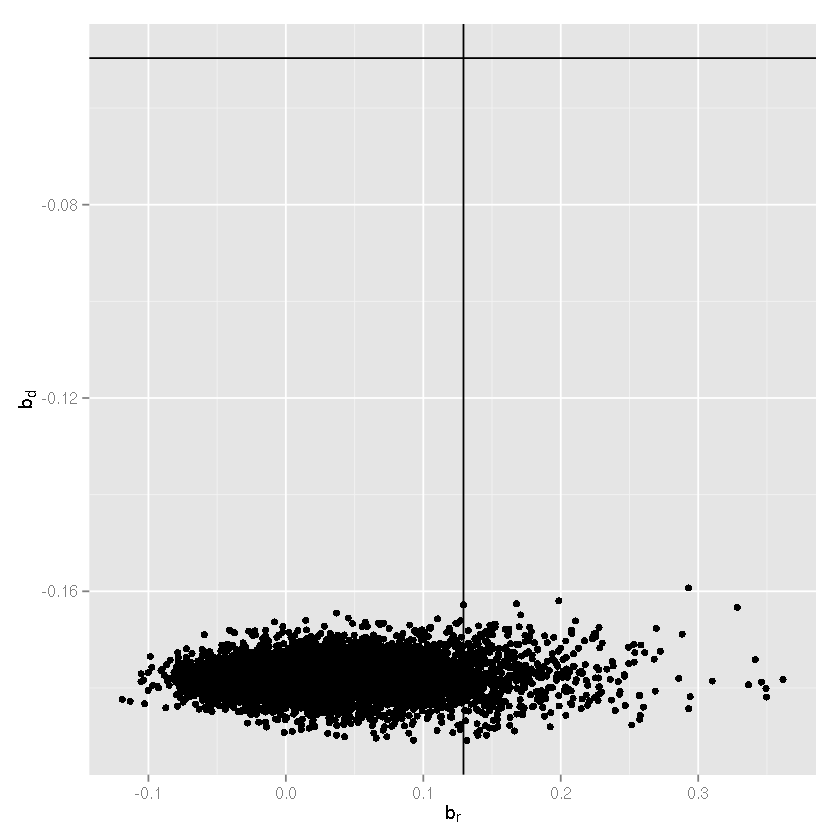

In [46]:

library(ggplot2)
#Plot maximum 5000 points
ggplot(reg_coef[1:min(nrMCS, 5000), ], aes(x=Coef_ret, y=Coef_div_growth)) +
  geom_point() +
  geom_vline(xintercept= br) +
  geom_hline(yintercept= bd ) +
  xlab(expression(b[r])) +
  ylab(expression(b[d]))



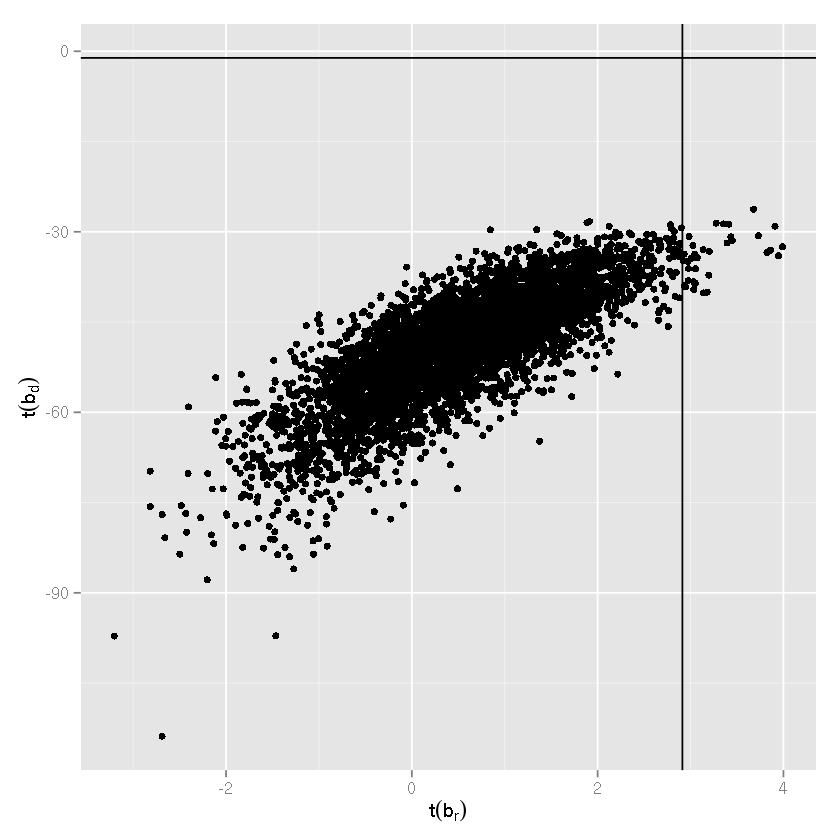

In [47]:
#Plot maximum 5000 points
ggplot(reg_coef[1:min(nrMCS, 5000), ], aes(x=tValue_ret, y=tValue_div_growth)) +
  geom_point() +
  geom_vline(xintercept= tr )+
  geom_hline(yintercept= td) +
  xlab(expression(t(b[r]))) +
  ylab(expression(t(b[d])))


[1] 0

[1] 0

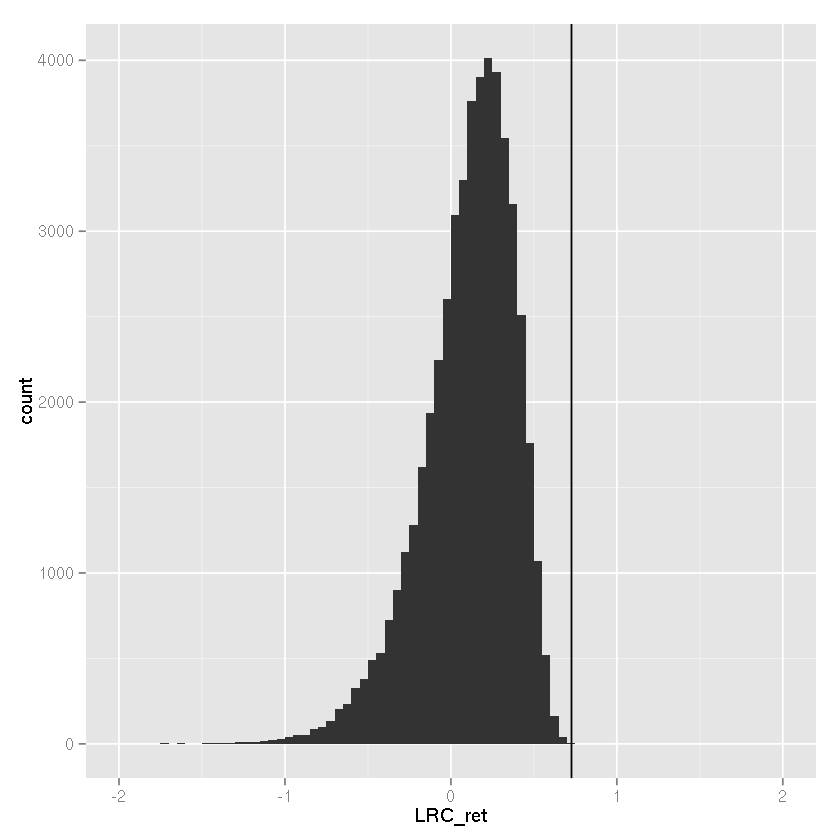

In [48]:
reg_coef$LRC_ret <- reg_coef$Coef_ret / (1-rho*reg_coef$Coef_dp)
ggplot(reg_coef, aes(x=LRC_ret)) +
  geom_histogram(binwidth=0.05) +
  geom_vline(xintercept = LR_br ) +
  xlim(-2, 2)

LRC_ret_sim <- sum(reg_coef$LRC_ret > LR_br )/nrMCS*100
LRC_ret_sim1 <- sum(reg_coef$LRC_ret > LR_br_Implied1 )/nrMCS*100
LRC_ret_sim2 <- sum(reg_coef$LRC_ret > LR_br_Implied2 )/nrMCS*100
LRC_ret_sim3 <- sum(reg_coef$LRC_ret > LR_br_Implied3 )/nrMCS*100

LRC_div_sim <- sum(reg_coef$LRC_div > LR_bd )/nrMCS*100

LRC_ret_sim ; LRC_div_sim
sim_LRC <- cbind(LRC_ret_sim, LRC_ret_sim1, LRC_ret_sim2, LRC_ret_sim3)
write.csv(sim_LRC, file = "br nol LRC.csv")


In [67]:
##### dividend price ratio ### masukin phi
reg_coef$LRC_div <- reg_coef$Coef_div_growth / (1-rho*reg_coef$Coef_dp)
# LRC_div
ggplot(reg_coef, aes(x=reg_coef$Coef_dp)) +
    geom_histogram(binwidth=reg_coef$LRC_div) +
    geom_vline(xintercept = mean(reg_coef$Coef_dp ), linetype = "dotted", color="red") +
    geom_vline(xintercept = LR_bd) +
    xlim(-2, 2)


# bias_null_return <- colMeans(reg_coef)[1:8]
# write.csv(bias_null_return, file = " Nilai bias null return.csv")

ERROR: Error in exists(name, envir = env, mode = mode): argument "env" is missing, with no default


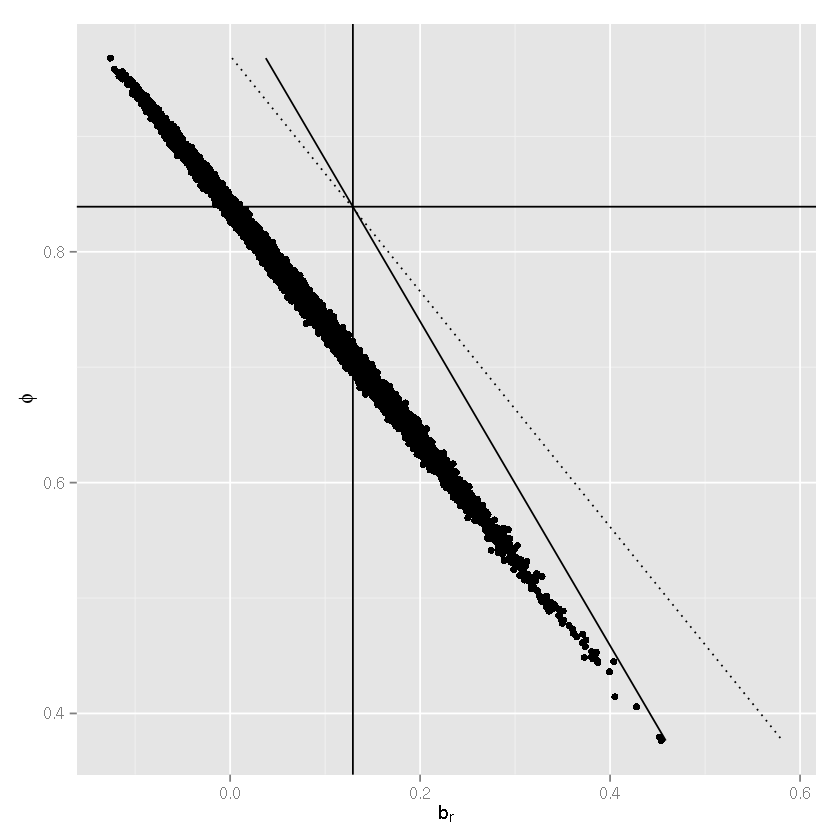

In [49]:

ggplot(reg_coef[1:min(nrMCS, 50000), ], aes(x=Coef_ret, y=Coef_dp)) +
  geom_point() +
  geom_vline(xintercept=br) +
  geom_hline(yintercept=phi) +
  xlab(expression(b[r])) +
  ylab(expression(phi)) +
  geom_line(aes(x=1-rho*c(min(Coef_dp),max(Coef_dp)) + bd,
                y=c(min(Coef_dp),max(Coef_dp))),
            linetype="dotted") +
  geom_line(aes(x=br*(1-rho*c(min(Coef_dp),max(Coef_dp)))/(1-rho*phi),
                y=c(min(Coef_dp),max(Coef_dp))))


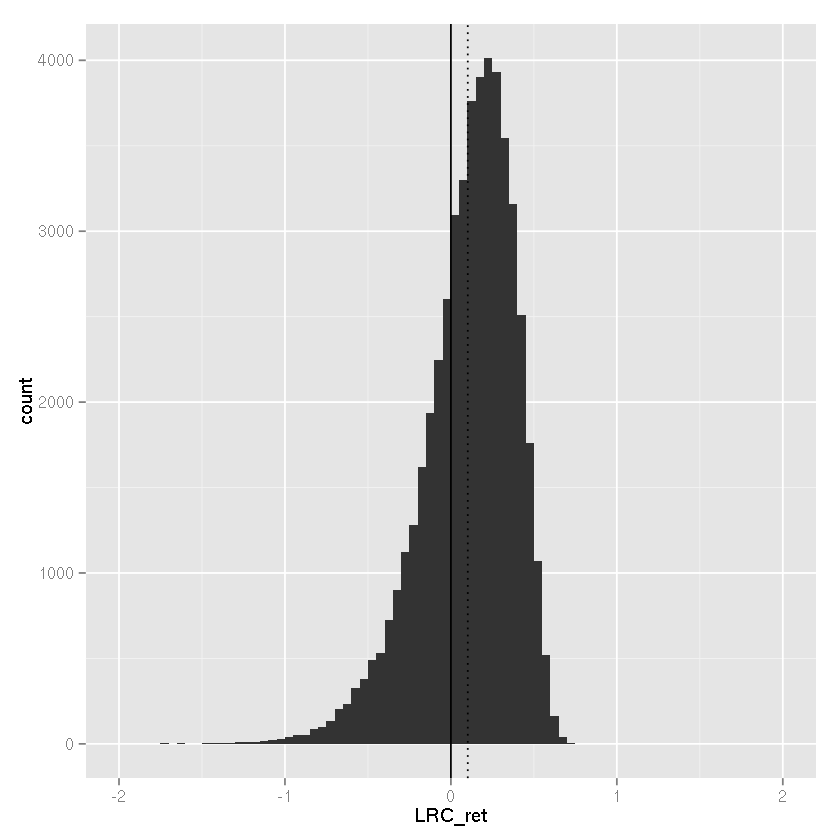

In [53]:
########   Bias LRReturn

reg_coef$LRC_ret <- reg_coef$Coef_ret / (1-rho*reg_coef$Coef_dp)
ggplot(reg_coef, aes(x=LRC_ret)) +
  geom_histogram(binwidth=0.05) +
  geom_vline(xintercept = mean(reg_coef$LRC_ret), linetype = "dotted") +
  geom_vline(xintercept = 0) +
  xlim(-2, 2)




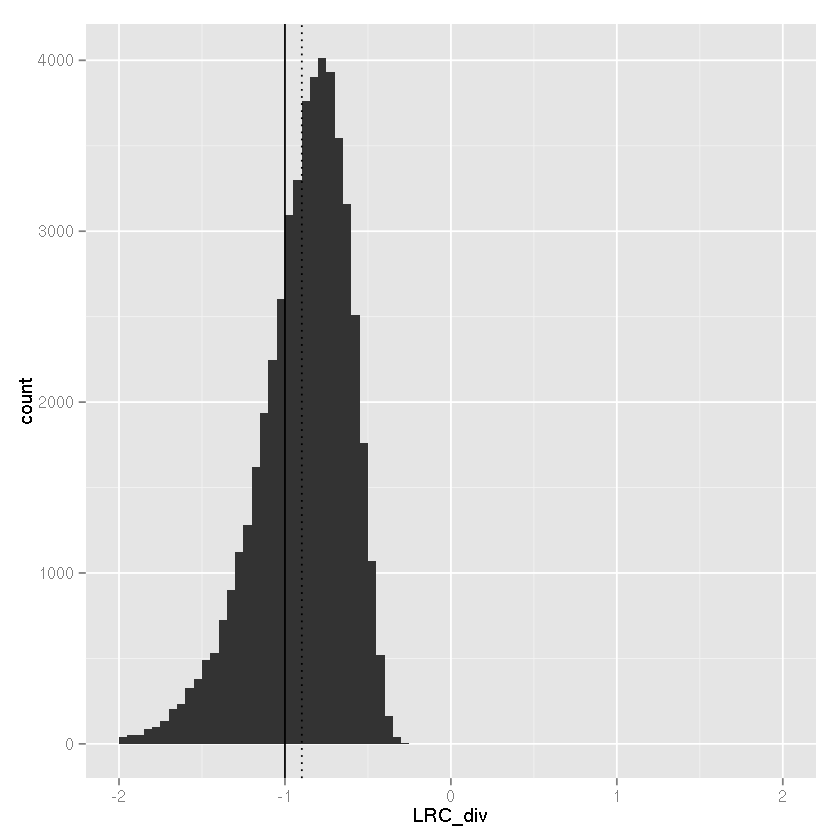

In [54]:

# bias LRDividend
reg_coef$LRC_div <- reg_coef$Coef_div_growth / (1-rho*reg_coef$Coef_dp)
ggplot(reg_coef, aes(x=LRC_div)) +
  geom_histogram(binwidth=0.05) +
  geom_vline(xintercept = mean(reg_coef$LRC_div ), linetype = "dotted") +
  geom_vline(xintercept = -1 ) +
  xlim(-2, 2)


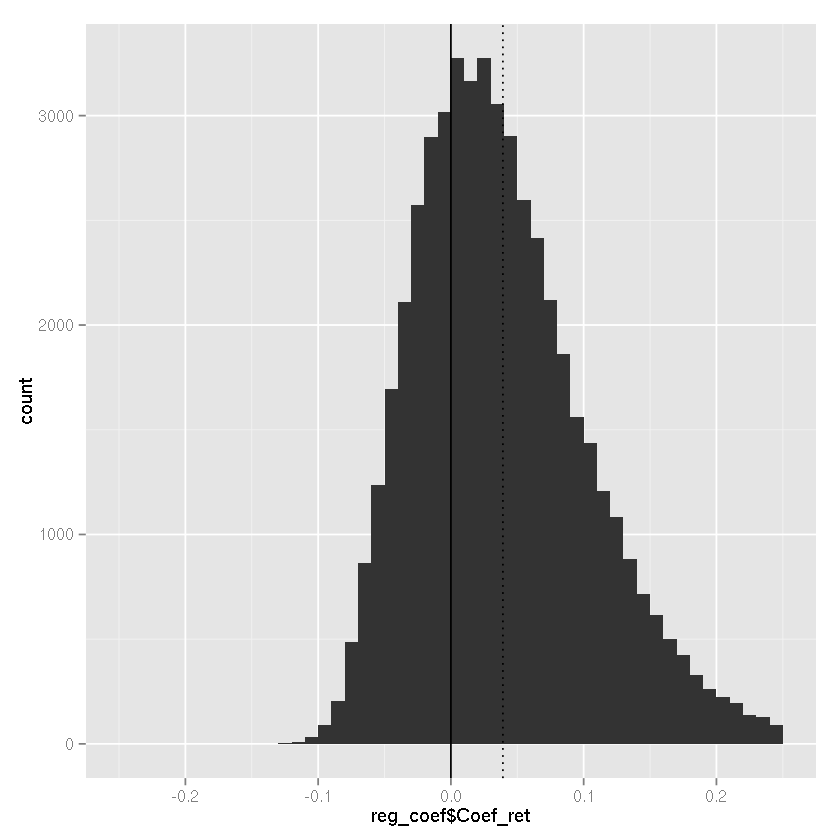

In [55]:
##### Return
ggplot(reg_coef, aes(x=reg_coef$Coef_ret )) +
  geom_histogram(binwidth=0.01) +
  geom_vline(xintercept = mean(reg_coef$Coef_ret ), linetype = "dotted") +
  geom_vline(xintercept = 0 ) +
  xlim(-0.25, 0.25)

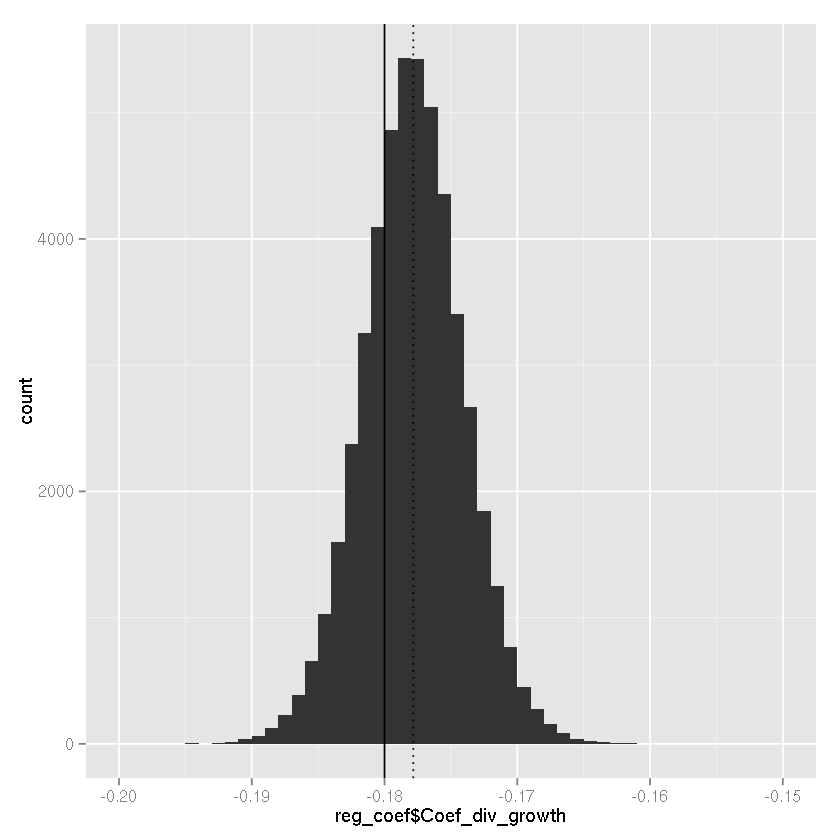

In [56]:
##### Dividend ## masukin nilai bd null
ggplot(reg_coef, aes(x=reg_coef$Coef_div_growth )) +
  geom_histogram(binwidth=0.001) +
  geom_vline(xintercept = mean(reg_coef$Coef_div_growth ), linetype = "dotted") +
  geom_vline(xintercept = -0.18) +
  xlim(-0.2, -0.15)


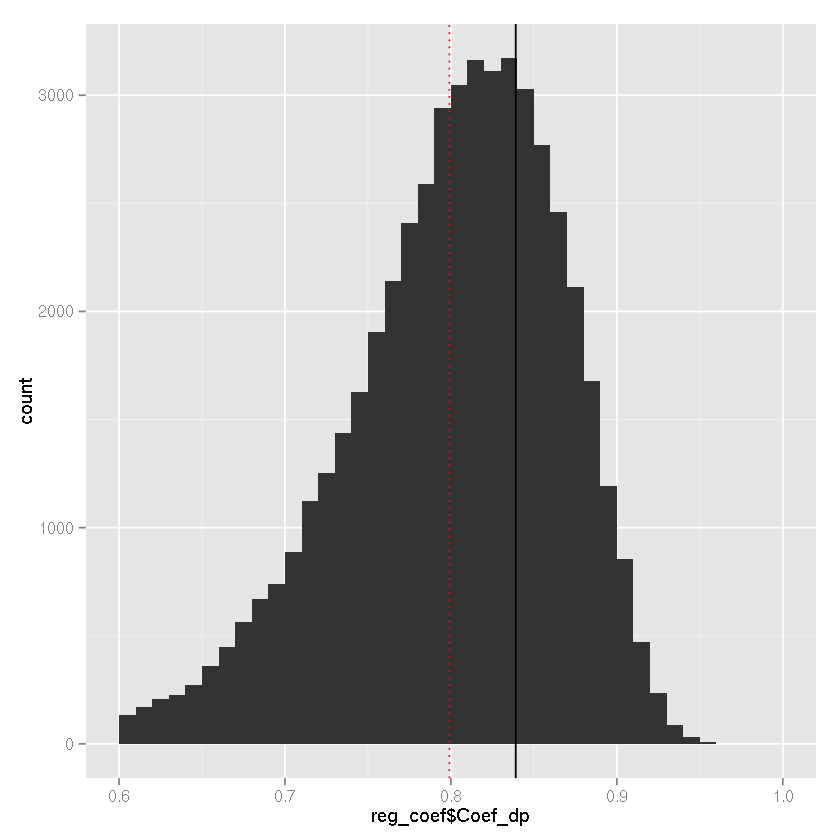

In [57]:
##### dividend price ratio ### masukin phi
ggplot(reg_coef, aes(x=reg_coef$Coef_dp)) +
  geom_histogram(binwidth=0.01) +
  geom_vline(xintercept = mean(reg_coef$Coef_dp ), linetype = "dotted", color="red") +
  geom_vline(xintercept = 0.8390648) +
  xlim(0.6, 1)


bias_null_return <- colMeans(reg_coef)[1:8]
write.csv(bias_null_return, file = " Nilai bias null return.csv")

In [ ]:


nrMCS <- 50000 #Otherwise it runs quite long
vec_phi <- c( 0.6, 0.7, 0.8, phi, 0.86, 0.88, 0.9, 0.941, 0.96, 0.98, 0.99, 1, 1.01)
df <- data.frame(Phi = vec_phi,
                 br = 0,
                 bd = 0,
                 LR = 0,
                 LR1 = 0,
                 LR2 = 0,
                 LR3 =0,
                 LRD = 0,
                 LRD1 = 0,
                 LRD2 = 0,
                 LRD3 = 0,
                 mean_r = 0,
                 mean_d = 0,
                 mean_dp = 0,
                 mean_LRR = 0,
                 mean_LRD = 0,
                 bd_i = 0
)
df[, 1] <- vec_phi
i <- 1
for (p in vec_phi) {
  int_reg_coef <- run_MCS(nrMCS = nrMCS, phi=p, rho=rho, nrT = nrow(dp), vec_sd = vec_sd)
  df[i, 2] <- sum(int_reg_coef$Coef_ret > br )/nrMCS*100
  df[i, 3] <- sum(int_reg_coef$Coef_div_growth > bd)/nrMCS*100
  int_reg_coef$LRC_ret <- int_reg_coef$Coef_ret / (1-rho*int_reg_coef$Coef_dp)
  df[i, 4] <- sum(int_reg_coef$LRC_ret > LR_br)/nrMCS*100
  df[i, 5] <- sum(int_reg_coef$LRC_ret > LR_br_Implied1)/nrMCS*100
  df[i, 6] <- sum(int_reg_coef$LRC_ret > LR_br_Implied2)/nrMCS*100
  df[i, 7] <- sum(int_reg_coef$LRC_ret > LR_br_Implied3)/nrMCS*100
  int_reg_coef$LRC_div <- int_reg_coef$Coef_div_growth / (1-rho*int_reg_coef$Coef_dp)
  df[i, 8] <- sum(int_reg_coef$LRC_div > LR_bd)/nrMCS*100
  df[i, 9] <- sum(int_reg_coef$LRC_div > LR_bd_Implied1)/nrMCS*100
  df[i, 10] <- sum(int_reg_coef$LRC_div > LR_bd_Implied2)/nrMCS*100
  df[i, 11] <- sum(int_reg_coef$LRC_div > LR_bd_Implied3)/nrMCS*100
  df[i, 12] <- mean(int_reg_coef$Coef_ret)
  df[i, 13] <- mean(int_reg_coef$Coef_div_growth)
  df[i, 14] <- mean(int_reg_coef$Coef_dp)
  df[i, 15] <- mean(int_reg_coef$LRC_ret)
  df[i, 16] <- mean(int_reg_coef$LRC_div)
  df[i, 17] <- p*rho -1
  i <- i + 1
}
print(df)


write.csv(df, file ="br nol, phi.csv" )
